# <a id='toc1_'></a>[Titanic - Kaggle](#toc0_)
<img src="./images/titanic.jpg" alt="Titanic" style="height: 500px;">

## <a id='toc0_'></a>[Pipeline de análise de dados](#toc0_)

  - **[Pré-processamento de Dados](#toc1_2_)**
    - [Importação de bibliotecas](#toc1_2_1_)
    - [Importação do conjunto de dados](#toc1_2_2_)
    - [Informações básicas do conjunto de dados](#toc1_2_3_)
      - [Dataframe de treino](#toc1_2_3_1_)
      - [Dataframe de teste](#toc1_2_3_2_)
    - [Análise exploratória de dados (EDA)](#toc1_2_4_)
      - [Verificando dados distintos por variável](#toc1_2_4_1_)
      - [Será eliminada as variáveis que não possuem dados significativos para a análise](#toc1_2_4_2_)
      - [Resultado das variáveis de treino](#toc1_2_4_3_)
      - [Resultado das variáveis de teste](#toc1_2_4_4_)
      - [Verificando dados de treino inválidos e vazios por variável](#toc1_2_4_5_)
      - [Preenchendo os valores no dataset de treino](#toc1_2_4_6_)
      - [Verificando dados de teste inválidos e vazios por variável](#toc1_2_4_7_)
      - [Preenchendo os valores no dataset de teste](#toc1_2_4_8_)
      - [Alterando os valores das classes categóricas em números inteiros na base de treino](#toc1_2_4_9_)
      - [Alterando os valores das classes categóricas em números inteiros na base de teste](#toc1_2_4_10_)
      - [Verificação da correlação das variáveis independentes com a variável dependente](#toc1_2_4_11_)
    - [Tratamento de valores atípicos (outliers)](#toc1_2_5_)
      - [Análise estatística descritiva para verificação de outliers](#toc1_2_5_1_)
        - [Analisando a variável Fare](#toc1_2_5_1_1_)
  
  - **[Modelagem](#toc1_3_)**
    - [Divisão do conjunto de dados em treino e validação](#toc1_3_1_)
    - [Construção de modelos de machine learning](#toc1_3_2_)
      - [RandomForestClassifier](#toc1_3_2_1_)
      - [GradientBoostingClassifier](#toc1_3_2_2_)
      - [LogisticRegression](#toc1_3_2_3_)
      - [Avaliação de desempenho dos modelos](#toc1_3_2_4_)
    - [Ajuste de hiperparâmetros](#toc1_3_3_)
      - [RandomForestClassifier](#toc1_3_3_1_)
      - [GradientBoostingClassifier](#toc1_3_3_2_)
      - [LogisticRegression](#toc1_3_3_3_)
    - [Validação cruzada (Cross Validation)](#toc1_3_4_)
      - [RandomForestClassifier](#toc1_3_4_1_)
      - [GradientBoostingClassifier](#toc1_3_4_2_)
      - [LogisticRegression](#toc1_3_4_3_)

  - **[Submeter soluções no Kaggle (submissions)](#toc1_4_)**
    - [Random Forest (Default)](#toc1_4_1_)
    - [Gradient Boosting (Bayes + CV)](#toc1_4_2_)
    - [Logistic Regression (Default)](#toc1_4_3_)

  - **[Melhorando o modelo com "mais" hiperparâmetros](#toc1_5_)**
    - [Retreinando com novos hiperparâmetros](#toc1_5_1_)
    - [Comparando os modelos](#toc1_5_2_)
    - [Submeter no kaggle](#toc1_5_3_)

  - **[Será que existe uma nova variável "escondida"?](#toc1_6_)**
    - [Analisando mulheres e homens salvos](#toc1_6_1_)
    - [Analisando as crianças salvas](#toc1_6_2_)

  - **[Adicionando uma feature nova](#toc1_7_)**

  - **[Treinando o modelo com a nova feature](#toc1_8_)**

  - **[Conclusão e resumo](#toc1_9_)**

## <a id='toc1_2_'></a>[Pré-processamento de Dados](#toc0_)

### <a id='toc1_2_1_'></a>[Importação de bibliotecas](#toc0_)

In [170]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from ydata_profiling import ProfileReport
import warnings
from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score

warnings.filterwarnings('ignore')
%matplotlib inline
cmap = sns.color_palette('Blues')

### <a id='toc1_2_2_'></a>[Importação do conjunto de dados](#toc0_)

In [171]:
df_train = pd.read_csv('./data/train.csv')
df_test = pd.read_csv('./data/test.csv')

### <a id='toc1_2_3_'></a>[Informações básicas do conjunto de dados](#toc0_)

#### <a id='toc1_2_3_1_'></a>[Dataframe de treino](#toc0_)

In [172]:
ProfileReport(df_train, title='Relatório de treino')

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

#### <a id='toc1_2_3_2_'></a>[Dataframe de teste](#toc0_)

In [173]:
ProfileReport(df_test, title='Relatório de teste')

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

### <a id='toc1_2_4_'></a>[Análise exploratória de dados (EDA)](#toc0_)

_Com base no relatório de treino (relatório acima) encontramos algumas variáveis independentes que não serão usadas por não haver um padrão e não ter correlação com a variável dependente (alvo)._

_Abaixo vamos verificar a quantidade de dados distintos por variável e na sequencia vamos eliminar as variáveis não necessárias._

_Faremos este procedimento tanto em treino como em teste._

#### <a id='toc1_2_4_1_'></a>[Verificando dados distintos por variável](#toc0_)

In [174]:
df_train.apply(lambda coluna: len(coluna.unique()))

PassengerId    891
Survived         2
Pclass           3
Name           891
Sex              2
Age             89
SibSp            7
Parch            7
Ticket         681
Fare           248
Cabin          148
Embarked         4
dtype: int64

#### <a id='toc1_2_4_2_'></a>[Será eliminada as variáveis que não possuem dados significativos para a análise](#toc0_)

In [175]:
drop_columns_train = [
                'PassengerId',
                'Name',
                'Ticket',
                'Cabin',
              ]

drop_columns_test = [
                'Name',
                'Ticket',
                'Cabin',
              ]

df_train.drop(columns=drop_columns_train, inplace=True)
df_test.drop(columns=drop_columns_test, inplace=True)

#### <a id='toc1_2_4_3_'></a>[Resultado das variáveis de treino](#toc0_)

In [176]:
df_train.apply(lambda coluna: len(coluna.unique()))

Survived      2
Pclass        3
Sex           2
Age          89
SibSp         7
Parch         7
Fare        248
Embarked      4
dtype: int64

#### <a id='toc1_2_4_4_'></a>[Resultado das variáveis de teste](#toc0_)

In [177]:
df_test.apply(lambda coluna: len(coluna.unique()))

PassengerId    418
Pclass           3
Sex              2
Age             80
SibSp            7
Parch            8
Fare           170
Embarked         3
dtype: int64

_Agora vamos verificar as variáveis nos datasets de treino e teste se possuem dados inválidos e vazios._

_Depois vamos na sequencia preencher com os valores da média (Age e Fare) e moda (Embarked)_ 

#### <a id='toc1_2_4_5_'></a>[Verificando dados de treino inválidos e vazios por variável](#toc0_)

In [178]:
df_train.apply(lambda coluna: coluna.isnull().sum())

Survived      0
Pclass        0
Sex           0
Age         177
SibSp         0
Parch         0
Fare          0
Embarked      2
dtype: int64

#### <a id='toc1_2_4_6_'></a>[Preenchendo os valores no dataset de treino](#toc0_)

In [179]:
mean_age = df_train['Age'].mean()
mode_embarked = df_train['Embarked'].mode()[0]

df_train['Age'].fillna(mean_age, inplace=True)
df_train['Embarked'].fillna(mode_embarked, inplace=True)

df_train.apply(lambda coluna: coluna.isnull().sum())

Survived    0
Pclass      0
Sex         0
Age         0
SibSp       0
Parch       0
Fare        0
Embarked    0
dtype: int64

#### <a id='toc1_2_4_7_'></a>[Verificando dados de teste inválidos e vazios por variável](#toc0_)

In [180]:
df_test.apply(lambda coluna: coluna.isnull().sum())

PassengerId     0
Pclass          0
Sex             0
Age            86
SibSp           0
Parch           0
Fare            1
Embarked        0
dtype: int64

#### <a id='toc1_2_4_8_'></a>[Preenchendo os valores no dataset de teste](#toc0_)

In [181]:
mean_age = df_test['Age'].mean()
mean_fare = df_test['Fare'].mean()

df_test['Age'].fillna(mean_age, inplace=True)
df_test['Fare'].fillna(mean_fare, inplace=True)

df_test.apply(lambda coluna: coluna.isnull().sum())

PassengerId    0
Pclass         0
Sex            0
Age            0
SibSp          0
Parch          0
Fare           0
Embarked       0
dtype: int64

#### <a id='toc1_2_4_9_'></a>[Alterando os valores das classes categóricas em números inteiros na base de treino](#toc0_)

In [182]:
df_train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 891 entries, 0 to 890
Data columns (total 8 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   Survived  891 non-null    int64  
 1   Pclass    891 non-null    int64  
 2   Sex       891 non-null    object 
 3   Age       891 non-null    float64
 4   SibSp     891 non-null    int64  
 5   Parch     891 non-null    int64  
 6   Fare      891 non-null    float64
 7   Embarked  891 non-null    object 
dtypes: float64(2), int64(4), object(2)
memory usage: 55.8+ KB


In [183]:
df_train['Sex'].value_counts()

Sex
male      577
female    314
Name: count, dtype: int64

In [184]:
le = LabelEncoder()
df_train['Sex'] = le.fit_transform(df_train["Sex"])
df_train['Sex'].value_counts()

Sex
1    577
0    314
Name: count, dtype: int64

In [185]:
df_train['Embarked'].value_counts()


Embarked
S    646
C    168
Q     77
Name: count, dtype: int64

In [186]:
le = LabelEncoder()
df_train['Embarked'] = le.fit_transform(df_train["Embarked"])
df_train['Embarked'].value_counts()

Embarked
2    646
0    168
1     77
Name: count, dtype: int64

In [187]:
df_train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 891 entries, 0 to 890
Data columns (total 8 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   Survived  891 non-null    int64  
 1   Pclass    891 non-null    int64  
 2   Sex       891 non-null    int32  
 3   Age       891 non-null    float64
 4   SibSp     891 non-null    int64  
 5   Parch     891 non-null    int64  
 6   Fare      891 non-null    float64
 7   Embarked  891 non-null    int32  
dtypes: float64(2), int32(2), int64(4)
memory usage: 48.9 KB


#### <a id='toc1_2_4_10_'></a>[Alterando os valores das classes categóricas em números inteiros na base de teste](#toc0_)

In [188]:
df_test.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 418 entries, 0 to 417
Data columns (total 8 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   PassengerId  418 non-null    int64  
 1   Pclass       418 non-null    int64  
 2   Sex          418 non-null    object 
 3   Age          418 non-null    float64
 4   SibSp        418 non-null    int64  
 5   Parch        418 non-null    int64  
 6   Fare         418 non-null    float64
 7   Embarked     418 non-null    object 
dtypes: float64(2), int64(4), object(2)
memory usage: 26.3+ KB


In [189]:
df_test['Sex'].value_counts()

Sex
male      266
female    152
Name: count, dtype: int64

In [190]:
le = LabelEncoder()
df_test['Sex'] = le.fit_transform(df_test["Sex"])
df_test['Sex'].value_counts()

Sex
1    266
0    152
Name: count, dtype: int64

In [191]:
df_test['Embarked'].value_counts()

Embarked
S    270
C    102
Q     46
Name: count, dtype: int64

In [192]:
le = LabelEncoder()
df_test['Embarked'] = le.fit_transform(df_test["Embarked"])
df_test['Embarked'].value_counts()

Embarked
2    270
0    102
1     46
Name: count, dtype: int64

In [193]:
df_test.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 418 entries, 0 to 417
Data columns (total 8 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   PassengerId  418 non-null    int64  
 1   Pclass       418 non-null    int64  
 2   Sex          418 non-null    int32  
 3   Age          418 non-null    float64
 4   SibSp        418 non-null    int64  
 5   Parch        418 non-null    int64  
 6   Fare         418 non-null    float64
 7   Embarked     418 non-null    int32  
dtypes: float64(2), int32(2), int64(4)
memory usage: 23.0 KB


#### <a id='toc1_2_4_11_'></a>[Verificação da correlação das variáveis independentes com a variável dependente](#toc0_)

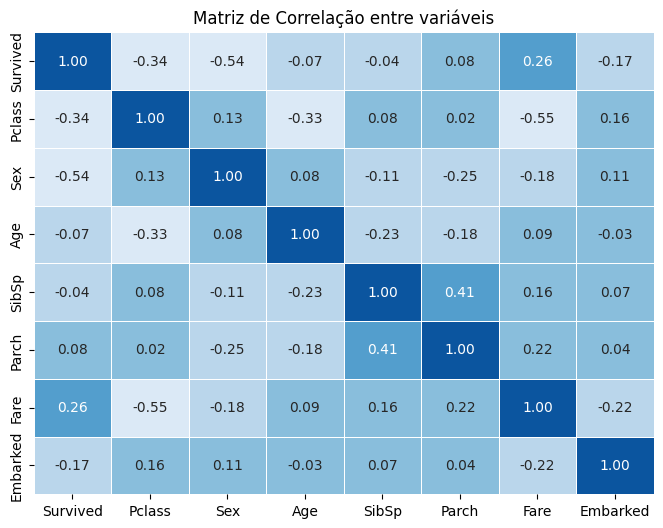

In [194]:
correlation_matrix = df_train.corr()

plt.figure(figsize=(8, 6))
sns.heatmap(correlation_matrix, annot=True, cmap=cmap, fmt='.2f', linewidths=.5, cbar=False)
plt.title('Matriz de Correlação entre variáveis')
plt.show()

_Na matrix de correlação acima podemos interpretar uma alta correlação entre Sex e Survived._

_Não existem muitas variáveis independentes altamente correlacionadas entre si._

_Outro ponto que podemos observar que algumas variáveis independentes possuem baixa correlação com a variável dependente._

**Nesta primeira etapa, vamos manter essas variáveis.**

### <a id='toc1_2_5_'></a>[Tratamento de valores atípicos (outliers)](#toc0_)

#### <a id='toc1_2_5_1_'></a>[Análise estatística descritiva para verificação de outliers](#toc0_)

In [195]:
df_train.describe()

,Survived,Pclass,Sex,Age,SibSp,Parch,Fare,Embarked
count,891.000000,891.000000,891.000000,891.000000,891.000000,891.000000,891.000000,891.000000
mean,0.383838,2.308642,0.647587,29.699118,0.523008,0.381594,32.204208,1.536476
std,0.486592,0.836071,0.477990,13.002015,1.102743,0.806057,49.693429,0.791503
min,0.000000,1.000000,0.000000,0.420000,0.000000,0.000000,0.000000,0.000000
25%,0.000000,2.000000,0.000000,22.000000,0.000000,0.000000,7.910400,1.000000
50%,0.000000,3.000000,1.000000,29.699118,0.000000,0.000000,14.454200,2.000000
75%,1.000000,3.000000,1.000000,35.000000,1.000000,0.000000,31.000000,2.000000
max,1.000000,3.000000,1.000000,80.000000,8.000000,6.000000,512.329200,2.000000


Nossas variáveis numéricas estão distribuídas:
- Binária: Survived e Sex
- Categórica: Pclass e Embarked
- Contínua: Age e Fare
- Discreta: SibSp e Parch

Vamos analisar como estão as distribuições das variáveis contínuas, porque essas variáveis podem apresentar outliers.

In [196]:
columns_continuous = ['Age', 'Fare']
df_train[columns_continuous].describe()

,Age,Fare
count,891.000000,891.000000
mean,29.699118,32.204208
std,13.002015,49.693429
min,0.420000,0.000000
25%,22.000000,7.910400
50%,29.699118,14.454200
75%,35.000000,31.000000
max,80.000000,512.329200


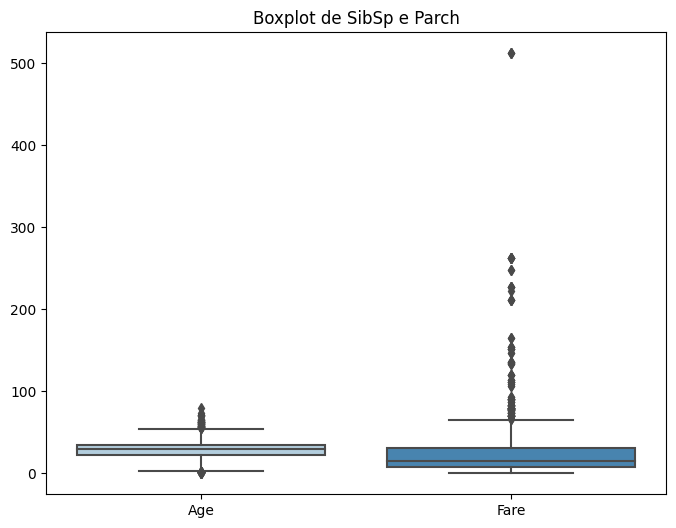

In [197]:
plt.figure(figsize=(8, 6))
sns.boxplot(data=df_train[columns_continuous], palette='Blues')
plt.title('Boxplot de SibSp e Parch')
plt.xlabel('')
plt.ylabel('')
plt.show()

Neste primeiro momento, vamos manter as idades e vamos analisar os outliers de Fare

##### <a id='toc1_2_5_1_1_'></a>[Analisando a variável Fare](#toc0_)

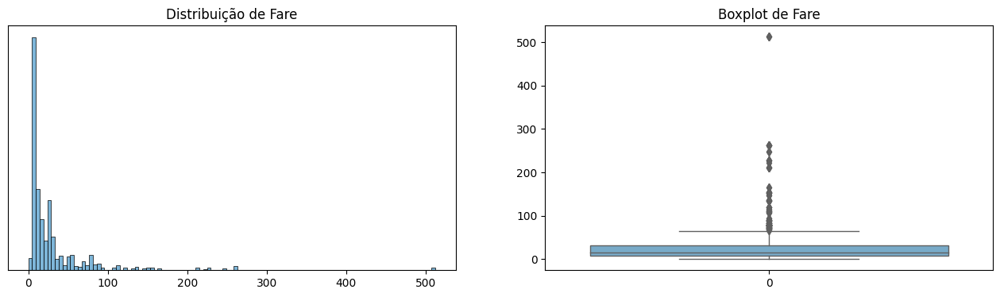

In [198]:
fig, (ax_1, ax_2) = plt.subplots(1, 2, figsize=(16, 4))
ax_1 = sns.histplot(data=df_train, x='Fare', linewidth=0.5, color=cmap[3], ax=ax_1)
ax_1.set_title('Distribuição de Fare')
ax_1.set_xlabel('')
ax_1.set_ylabel('')
ax_1.set_yticks([])

ax_2 = sns.boxplot(data=df_train['Fare'],linewidth=1, palette='Blues', ax=ax_2)
ax_2.set_title('Boxplot de Fare')
ax_2.set_xlabel('')
ax_2.set_ylabel('')

plt.show()

Vamos aplicar o método interquartial para observação dos outliers usando como fator de multiplicação 2 (um pouco mais permissivo aos outliers)

In [199]:
Q1 = df_train['Fare'].quantile(0.25)
Q3 = df_train['Fare'].quantile(0.75)

IQR = Q3 - Q1

lower_bound = Q1 - 2 * IQR
upper_bound = Q3 + 2 * IQR

print(f'Valores acima de {lower_bound} e abaixo de {upper_bound} serão observados')

Valores acima de -38.2688 e abaixo de 77.17920000000001 serão observados


Como não existem valores negativos, vamos considerar apenas upper_bound.

Antes de eliminar os outliers, vamos observar as amostras.

In [200]:
df_fare_upper = df_train[df_train['Fare'] > upper_bound]
df_fare_upper

,Survived,Pclass,Sex,Age,SibSp,Parch,Fare,Embarked
27,0,1,1,19.000000,3,2,263.0000,2
31,1,1,0,29.699118,1,0,146.5208,0
34,0,1,1,28.000000,1,0,82.1708,0
61,1,1,0,38.000000,0,0,80.0000,2
62,0,1,1,45.000000,1,0,83.4750,2
...,...,...,...,...,...,...,...,...
829,1,1,0,62.000000,0,0,80.0000,2
835,1,1,0,39.000000,1,1,83.1583,0
849,1,1,0,29.699118,1,0,89.1042,0
856,1,1,0,45.000000,1,1,164.8667,2


Agora vamos verificar se esses outliers superior são da primeira classe

In [201]:
df_fare_upper['Pclass'].value_counts()

Pclass
1    92
Name: count, dtype: int64

Como todos os dados são da primeira classe, vamos verificar a média da primeira classe e preencher de forma aleatória + ou - 5

In [202]:
df_fare_1_mean = df_train[(df_train['Fare'] <= upper_bound) & (df_train['Pclass'] == 1)]['Fare'].mean()
min_fare_pclass_1, max_fare_pclass_1 = (df_fare_1_mean - 5, df_fare_1_mean + 5)
print(min_fare_pclass_1, max_fare_pclass_1)

35.45762983870968 45.45762983870968


In [203]:
df_train['Fare'] = np.where(df_train['Fare'] > upper_bound, np.random.randint(min_fare_pclass_1, max_fare_pclass_1, 1)[0], df_train['Fare'])
df_train.groupby('Pclass')['Fare'].describe()

,count,mean,std,min,25%,50%,75%,max
Pclass,,,,,,,,
1,216.0,38.133084,13.609354,0.0,30.92395,35.00,39.73125,76.7292
2,184.0,20.662183,13.417399,0.0,13.00000,14.25,26.00000,73.5000
3,491.0,13.675550,11.778142,0.0,7.75000,8.05,15.50000,69.5500


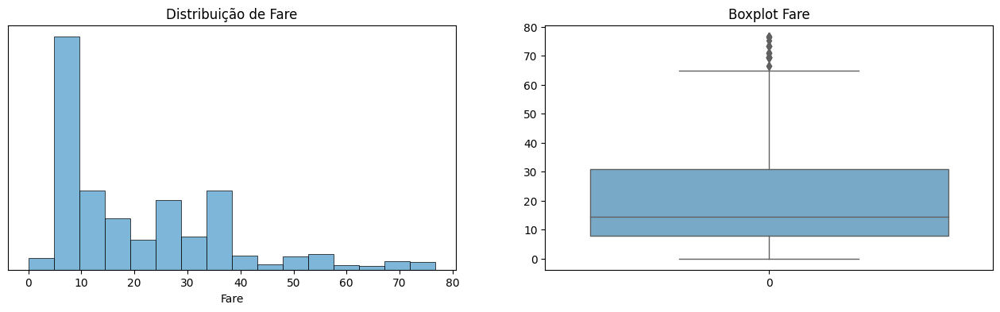

In [204]:
fig, (ax_1, ax_2) = plt.subplots(1, 2, figsize=(16, 4))
ax_1 = sns.histplot(data=df_train, x='Fare', color=cmap[3], linewidth=0.5, ax=ax_1)
ax_1.set_title('Distribuição de Fare')
ax_2.set_xlabel('')
ax_1.set_ylabel('')
ax_1.set_yticks([])

ax_2 = sns.boxplot(data=df_train['Fare'], palette='Blues', linewidth=1, ax=ax_2)
ax_2.set_title('Boxplot Fare')
ax_2.set_xlabel('')
ax_2.set_ylabel('')

plt.show()

## <a id='toc1_3_'></a>[Modelagem](#toc0_)

### <a id='toc1_3_1_'></a>[Divisão do conjunto de dados em treino e validação](#toc0_)

In [205]:
df_train.columns

Index(['Survived', 'Pclass', 'Sex', 'Age', 'SibSp', 'Parch', 'Fare',
       'Embarked'],
      dtype='object')

In [206]:
X_columns = [
              'Pclass',
              'Sex',
              'Age',
              'SibSp',
              'Parch',
              'Fare',
              'Embarked'
            ]

y_columns = ['Survived']

In [207]:
X_train, X_valid, y_train, y_valid = train_test_split(df_train[X_columns], df_train[y_columns], test_size=0.20, random_state=42)

### <a id='toc1_3_2_'></a>[Construção de modelos de machine learning](#toc0_)

Vou testar alguns modelos de classificação, dentre eles:
- RandomForestClassifier
- GradientBoostingClassifier
- LogisticRegression

In [208]:
result_clfs = pd.DataFrame(columns=['model_clf', 'train_mode', 'acc_train', 'acc_valid'])

#### <a id='toc1_3_2_1_'></a>[RandomForestClassifier](#toc0_)

In [209]:
from sklearn.ensemble import RandomForestClassifier
clf_rfc = RandomForestClassifier(random_state=0)

clf_rfc.fit(X_train, y_train)

RandomForestClassifier(random_state=0)

In [210]:
accuracy_clf_rfc_train = clf_rfc.score(X_train, y_train)

y_pred_clf_rfc = clf_rfc.predict(X_valid)
accuracy_clf_rfc_valid = accuracy_score(y_valid, y_pred_clf_rfc)

print(f'Valores de acurácia são: Train = {accuracy_clf_rfc_train:.5f} | Valid = {accuracy_clf_rfc_valid:.5f}')

result_clfs.loc[len(result_clfs)] = {
  'model_clf':'RandomForest',
  'train_mode':'default',
  'acc_train':accuracy_clf_rfc_train, 
  'acc_valid':accuracy_clf_rfc_valid
}

Valores de acurácia são: Train = 0.98034 | Valid = 0.82123


#### <a id='toc1_3_2_2_'></a>[GradientBoostingClassifier](#toc0_)

In [211]:
from sklearn.ensemble import GradientBoostingClassifier
clf_gbc = GradientBoostingClassifier(random_state=0)


clf_gbc.fit(X_train, y_train)

GradientBoostingClassifier(random_state=0)

In [212]:
accuracy_clf_gbc_train = clf_gbc.score(X_train, y_train)

y_pred_clf_gbc = clf_gbc.predict(X_valid)
accuracy_clf_gbc_valid = accuracy_score(y_valid, y_pred_clf_gbc)

print(f'Valores de acurácia são: Train = {accuracy_clf_gbc_train:.5f} | Valid = {accuracy_clf_gbc_valid:.5f}')

result_clfs.loc[len(result_clfs)] = {
  'model_clf':'GradientBoosting',
  'train_mode':'default',
  'acc_train':accuracy_clf_gbc_train, 
  'acc_valid':accuracy_clf_gbc_valid
}

Valores de acurácia são: Train = 0.89326 | Valid = 0.81564


#### <a id='toc1_3_2_3_'></a>[LogisticRegression](#toc0_)

In [213]:
from sklearn.linear_model import LogisticRegression
clf_lr = LogisticRegression(random_state=0)

clf_lr.fit(X_train, y_train)

LogisticRegression(random_state=0)

In [214]:
accuracy_clf_lr_train = clf_lr.score(X_train, y_train)

y_pred_clf_lr = clf_lr.predict(X_valid)
accuracy_clf_lr_valid = accuracy_score(y_valid, y_pred_clf_lr)

print(f'Valores de acurácia são: Train = {accuracy_clf_lr_train:.5f} | Valid = {accuracy_clf_lr_valid:.5f}')

result_clfs.loc[len(result_clfs)] = {
  'model_clf':'LogisticRegression',
  'train_mode':'default',
  'acc_train':accuracy_clf_lr_train, 
  'acc_valid':accuracy_clf_lr_valid
}

Valores de acurácia são: Train = 0.79213 | Valid = 0.80447


#### <a id='toc1_3_2_4_'></a>[Avaliação de desempenho dos modelos](#toc0_)

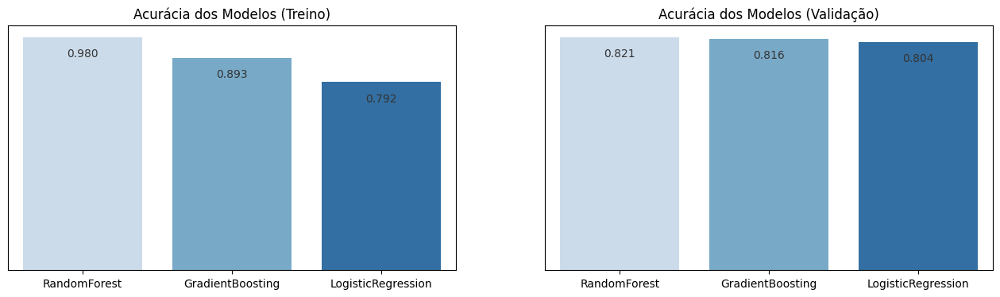

In [215]:
fig, (ax_1, ax_2) = plt.subplots(1, 2, figsize=(16, 4))
ax_1 = sns.barplot(result_clfs, x="model_clf", y="acc_train", estimator="sum", order=['RandomForest', 'GradientBoosting', 'LogisticRegression'] , palette='Blues', ax=ax_1, ci=None)
ax_1.bar_label(ax_1.containers[0],label_type='edge', padding=-20,color='#333', fontsize=10, fmt='%.3f')
ax_1.set_title('Acurácia dos Modelos (Treino)')
ax_1.set_yticks([])
ax_1.set_ylabel('')
ax_1.set_xlabel('')

ax_2 = sns.barplot(result_clfs, x="model_clf", y="acc_valid", estimator="sum", order=['RandomForest', 'GradientBoosting', 'LogisticRegression'] , palette='Blues', ax=ax_2, ci=None)
ax_2.bar_label(ax_2.containers[0],label_type='edge', padding=-20,color='#333', fontsize=10, fmt='%.3f')
ax_2.set_title('Acurácia dos Modelos (Validação)')
ax_2.set_ylabel('')
ax_2.set_yticks([])
ax_2.set_xlabel('')

plt.show()

Com esses resultados, onde testamos os modelos de forma padrão, não podemos afirmar qual modelo é mais eficiente.

Agora vamos realizar os ajustes através da otimização de hiperparâmetros utilizando o metodo otimização Bayesian.

**Poderíamos utilizar já a validação cruzada, mas para fiz didáticos vou realizá-los separados para que a gente tenha uma ideia do impacto dessa técnica.**

### <a id='toc1_3_3_'></a>[Ajuste de hiperparâmetros](#toc0_)

In [216]:
from skopt import BayesSearchCV

#### <a id='toc1_3_3_1_'></a>[RandomForestClassifier](#toc0_)

In [217]:
np.int = int # necessário devido ao um problema com a nova versão do Numpy (https://github.com/scikit-optimize/scikit-optimize/issues/1138)

clf_rfc_params = {
    'criterion': ['gini', 'entropy'],
    'n_estimators': (10, 200),
    'max_depth': (1, 20),
    'min_samples_split': (2, 10),
    'min_samples_leaf': (1, 10),
    'max_features': (0.1, 1.0),
}

clf_rfc_bayes = BayesSearchCV(
                    clf_rfc,                  # Modelo a ser otimizado
                    clf_rfc_params,           # Espaço de busca para os hiperparâmetros
                    n_iter=32,                # Número de iterações da busca bayesiana
                    scoring='accuracy',       # Métrica de avaliação
                    n_jobs=-1,                # Número de trabalhos paralelos, -1 utiliza todos os núcleos disponíveis
                    cv=None,                  # Número de dobras (folds) para validação cruzada
                    random_state=0
                )

clf_rfc_bayes.fit(X_train, y_train)

BayesSearchCV(estimator=RandomForestClassifier(random_state=0), n_iter=32,
              n_jobs=-1, random_state=0, scoring='accuracy',
              search_spaces={'criterion': ['gini', 'entropy'],
                             'max_depth': (1, 20), 'max_features': (0.1, 1.0),
                             'min_samples_leaf': (1, 10),
                             'min_samples_split': (2, 10),
                             'n_estimators': (10, 200)})

In [218]:
print(f'Melhores parâmetros: \n{clf_rfc_bayes.best_params_}')
print('')
print(f'Melhor modelo: \n{clf_rfc_bayes.best_estimator_}')

Melhores parâmetros: 
OrderedDict([('criterion', 'entropy'), ('max_depth', 16), ('max_features', 0.5229496363266255), ('min_samples_leaf', 5), ('min_samples_split', 9), ('n_estimators', 139)])

Melhor modelo: 
RandomForestClassifier(criterion='entropy', max_depth=16,
                       max_features=0.5229496363266255, min_samples_leaf=5,
                       min_samples_split=9, n_estimators=139, random_state=0)


In [219]:
result_clfs

,model_clf,train_mode,acc_train,acc_valid
0,RandomForest,default,0.980337,0.821229
1,GradientBoosting,default,0.893258,0.815642
2,LogisticRegression,default,0.792135,0.804469


In [220]:
acc_clf_rfc_bayes_train = clf_rfc_bayes.best_score_
acc_clf_rfc_bayes_test = clf_rfc_bayes.score(X_valid, y_valid)

print(f'Valores de acurácia são: Train = {acc_clf_rfc_bayes_train:.5f} | Valid = {acc_clf_rfc_bayes_test:.5f}')

result_clfs.loc[len(result_clfs)] = {
  'model_clf':'RandomForest',
  'train_mode':'bayes',
  'acc_train':acc_clf_rfc_bayes_train, 
  'acc_valid':acc_clf_rfc_bayes_test
}

Valores de acurácia são: Train = 0.83283 | Valid = 0.80447


#### <a id='toc1_3_3_2_'></a>[GradientBoostingClassifier](#toc0_)


In [221]:
clf_gbc_params = {
    'loss': ['log_loss', 'exponential'],
    'criterion': ['friedman_mse', 'squared_error'],
    'n_estimators': (10, 200),
    'learning_rate': (0.01, 1.0),
    'max_depth': (1, 20),
    'min_samples_split': (2, 10),
    'min_samples_leaf': (1, 10),
    'subsample': (0.1, 1.0),
}

clf_gbc_bayes = BayesSearchCV(
                    clf_gbc,                  # Modelo a ser otimizado
                    clf_gbc_params,           # Espaço de busca para os hiperparâmetros
                    n_iter=32,                # Número de iterações da busca bayesiana
                    scoring='accuracy',       # Métrica de avaliação
                    n_jobs=-1,                # Número de trabalhos paralelos, -1 utiliza todos os núcleos disponíveis
                    cv=None,                  # Número de dobras (folds) para validação cruzada
                    random_state=0
                )

clf_gbc_bayes.fit(X_train, y_train)

BayesSearchCV(estimator=GradientBoostingClassifier(random_state=0), n_iter=32,
              n_jobs=-1, random_state=0, scoring='accuracy',
              search_spaces={'criterion': ['friedman_mse', 'squared_error'],
                             'learning_rate': (0.01, 1.0),
                             'loss': ['log_loss', 'exponential'],
                             'max_depth': (1, 20), 'min_samples_leaf': (1, 10),
                             'min_samples_split': (2, 10),
                             'n_estimators': (10, 200),
                             'subsample': (0.1, 1.0)})

In [222]:
print(f'Melhores parâmetros: \n{clf_gbc_bayes.best_params_}')
print('')
print(f'Melhor modelo: \n{clf_gbc_bayes.best_estimator_}')

Melhores parâmetros: 
OrderedDict([('criterion', 'squared_error'), ('learning_rate', 0.01), ('loss', 'exponential'), ('max_depth', 3), ('min_samples_leaf', 1), ('min_samples_split', 3), ('n_estimators', 135), ('subsample', 0.63161442920014)])

Melhor modelo: 
GradientBoostingClassifier(criterion='squared_error', learning_rate=0.01,
                           loss='exponential', min_samples_split=3,
                           n_estimators=135, random_state=0,
                           subsample=0.63161442920014)


In [223]:
acc_clf_gbc_bayes_train = clf_gbc_bayes.best_score_
acc_clf_gbc_bayes_test = clf_gbc_bayes.score(X_valid, y_valid)

print(f'Valores de acurácia são: Train = {acc_clf_gbc_bayes_train:.5f} | Valid = {acc_clf_gbc_bayes_test:.5f}')

result_clfs.loc[len(result_clfs)] = {
  'model_clf':'GradientBoosting',
  'train_mode':'bayes',
  'acc_train':acc_clf_gbc_bayes_train, 
  'acc_valid':acc_clf_gbc_bayes_test
}

Valores de acurácia são: Train = 0.82304 | Valid = 0.79330


#### <a id='toc1_3_3_3_'></a>[LogisticRegression](#toc0_)

In [224]:
clf_lr_params = {
    'penalty': ['l2', 'none'],
    'tol': (1e-6, 1e-2),
    'C': (1e-6, 1e+6),
    'fit_intercept': [True, False],
    'solver': ['lbfgs', 'sag', 'saga'],
    'max_iter': (50, 500),
}

clf_lr_bayes = BayesSearchCV(
                    clf_lr,                   # Modelo a ser otimizado
                    clf_lr_params,            # Espaço de busca para os hiperparâmetros
                    n_iter=32,                # Número de iterações da busca bayesiana
                    scoring='accuracy',       # Métrica de avaliação
                    n_jobs=-1,                # Número de trabalhos paralelos, -1 utiliza todos os núcleos disponíveis
                    cv=None,                  # Número de dobras (folds) para validação cruzada
                    random_state=0
                )

clf_lr_bayes.fit(X_train, y_train)

BayesSearchCV(estimator=LogisticRegression(random_state=0), n_iter=32,
              n_jobs=-1, random_state=0, scoring='accuracy',
              search_spaces={'C': (1e-06, 1000000.0),
                             'fit_intercept': [True, False],
                             'max_iter': (50, 500), 'penalty': ['l2', 'none'],
                             'solver': ['lbfgs', 'sag', 'saga'],
                             'tol': (1e-06, 0.01)})

In [225]:
print(f'Melhores parâmetros: \n{clf_lr_bayes.best_params_}')
print('')
print(f'Melhor modelo: \n{clf_lr_bayes.best_estimator_}')

Melhores parâmetros: 
OrderedDict([('C', 258371.66197348977), ('fit_intercept', True), ('max_iter', 459), ('penalty', 'none'), ('solver', 'sag'), ('tol', 0.0016286621716671353)])

Melhor modelo: 
LogisticRegression(C=258371.66197348977, max_iter=459, penalty='none',
                   random_state=0, solver='sag', tol=0.0016286621716671353)


In [226]:
acc_clf_lr_bayes_train = clf_lr_bayes.best_score_
acc_clf_lr_bayes_test = clf_lr_bayes.score(X_valid, y_valid)

print(f'Valores de acurácia são: Train = {acc_clf_lr_bayes_train:.5f} | Valid = {acc_clf_lr_bayes_test:.5f}')

result_clfs.loc[len(result_clfs)] = {
  'model_clf':'LogisticRegression',
  'train_mode':'bayes',
  'acc_train':acc_clf_lr_bayes_train, 
  'acc_valid':acc_clf_lr_bayes_test
}

Valores de acurácia são: Train = 0.79211 | Valid = 0.78212


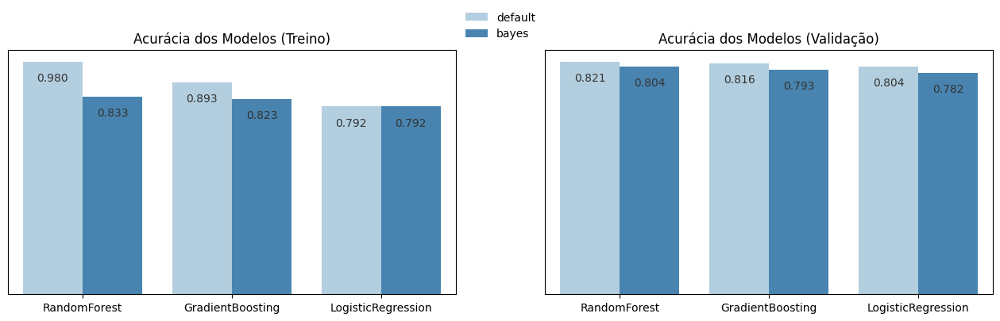

In [227]:
fig, (ax_1, ax_2) = plt.subplots(1, 2, figsize=(16, 4))
ax_1 = sns.barplot(result_clfs, x="model_clf", y="acc_train", hue='train_mode', estimator="sum", order=['RandomForest', 'GradientBoosting', 'LogisticRegression'] , palette='Blues', ax=ax_1)
ax_1.bar_label(ax_1.containers[0],label_type='edge', padding=-20,color='#333', fontsize=10, fmt='%.3f')
ax_1.bar_label(ax_1.containers[1],label_type='edge', padding=-20,color='#333', fontsize=10, fmt='%.3f')
ax_1.set_title('Acurácia dos Modelos (Treino)')
ax_1.set_ylabel('')
ax_1.set_yticks([])
sns.move_legend(
  ax_1, 
  "center",
  bbox_to_anchor=(1.1, 1.1),
  title='',
  frameon=False
)

ax_1.set_xlabel('')
ax_2 = sns.barplot(result_clfs, x="model_clf", y="acc_valid", hue='train_mode',estimator="sum", order=['RandomForest', 'GradientBoosting', 'LogisticRegression'] , palette='Blues', ax=ax_2)
ax_2.bar_label(ax_2.containers[0],label_type='edge', padding=-20,color='#333', fontsize=10, fmt='%.3f')
ax_2.bar_label(ax_2.containers[1],label_type='edge', padding=-20,color='#333', fontsize=10, fmt='%.3f')
ax_2.set_title('Acurácia dos Modelos (Validação)')
ax_2.set_ylabel('')
ax_2.set_xlabel('')
ax_2.set_yticks([])
ax_2.legend().set_visible(False)

plt.show()

Comparando os tipos de classificadores com o método aplicado, podemos verificar uma grande queda em Treino (Random Forest e Gradient Boosting) e uma pequena queda em Validação no método Bayesian em comparação com método "default" sem hiperparâmetros.

Então não funcionou os hiperparâmetros?

Não é bem isso! Poderíamos agora verificar novos parâmetros para "tunar", mas antes disso como comentei anteriormente, vamos usar a validação cruzada para verificarmos o que temos de melhoria.

Vamos usar o mesmo método e variáveis para manter uma constância nos testes e iremos analisar em seguida o que temos de _insights_.

### <a id='toc1_3_4_'></a>[Validação cruzada (Cross Validation)](#toc0_)

#### <a id='toc1_3_4_1_'></a>[RandomForestClassifier](#toc0_)

In [228]:
clf_rfc_bayes_cv = BayesSearchCV(
                        clf_rfc,                  # Modelo a ser otimizado
                        clf_rfc_params,           # Espaço de busca para os hiperparâmetros
                        n_iter=32,                # Número de iterações da busca bayesiana
                        scoring='accuracy',       # Métrica de avaliação
                        n_jobs=-1,                # Número de trabalhos paralelos, -1 utiliza todos os núcleos disponíveis
                        cv=5,                     # Número de dobras (folds) para validação cruzada
                        random_state=0
                    )

clf_rfc_bayes_cv.fit(X_train, y_train)

BayesSearchCV(cv=5, estimator=RandomForestClassifier(random_state=0), n_iter=32,
              n_jobs=-1, random_state=0, scoring='accuracy',
              search_spaces={'criterion': ['gini', 'entropy'],
                             'max_depth': (1, 20), 'max_features': (0.1, 1.0),
                             'min_samples_leaf': (1, 10),
                             'min_samples_split': (2, 10),
                             'n_estimators': (10, 200)})

In [229]:
print(f'Melhores parâmetros: \n{clf_rfc_bayes_cv.best_params_}')
print('')
print(f'Melhor modelo: \n{clf_rfc_bayes_cv.best_estimator_}')

Melhores parâmetros: 
OrderedDict([('criterion', 'entropy'), ('max_depth', 16), ('max_features', 0.5229496363266255), ('min_samples_leaf', 5), ('min_samples_split', 9), ('n_estimators', 139)])

Melhor modelo: 
RandomForestClassifier(criterion='entropy', max_depth=16,
                       max_features=0.5229496363266255, min_samples_leaf=5,
                       min_samples_split=9, n_estimators=139, random_state=0)


In [230]:
acc_clf_rfc_bayes_cv_train = clf_rfc_bayes_cv.best_score_
acc_clf_rfc_bayes_cv_test = clf_rfc_bayes_cv.score(X_valid, y_valid)

print(f'Valores de acurácia são: Train = {acc_clf_rfc_bayes_cv_train:.5f} | Valid = {acc_clf_rfc_bayes_cv_test:.5f}')

result_clfs.loc[len(result_clfs)] = {
  'model_clf':'RandomForest',
  'train_mode':'bayes_cv',
  'acc_train':acc_clf_rfc_bayes_cv_train, 
  'acc_valid':acc_clf_rfc_bayes_cv_test
}

Valores de acurácia são: Train = 0.83283 | Valid = 0.80447


#### <a id='toc1_3_4_2_'></a>[GradientBoostingClassifier](#toc0_)

In [231]:
clf_gbc_bayes_cv = BayesSearchCV(
                    clf_gbc,                  # Modelo a ser otimizado
                    clf_gbc_params,           # Espaço de busca para os hiperparâmetros
                    n_iter=32,                # Número de iterações da busca bayesiana
                    scoring='accuracy',       # Métrica de avaliação
                    n_jobs=-1,                # Número de trabalhos paralelos, -1 utiliza todos os núcleos disponíveis
                    cv=5,                     # Número de dobras (folds) para validação cruzada
                    random_state=0
                )

clf_gbc_bayes_cv.fit(X_train, y_train)

BayesSearchCV(cv=5, estimator=GradientBoostingClassifier(random_state=0),
              n_iter=32, n_jobs=-1, random_state=0, scoring='accuracy',
              search_spaces={'criterion': ['friedman_mse', 'squared_error'],
                             'learning_rate': (0.01, 1.0),
                             'loss': ['log_loss', 'exponential'],
                             'max_depth': (1, 20), 'min_samples_leaf': (1, 10),
                             'min_samples_split': (2, 10),
                             'n_estimators': (10, 200),
                             'subsample': (0.1, 1.0)})

In [232]:
print(f'Melhores parâmetros: \n{clf_gbc_bayes_cv.best_params_}')
print('')
print(f'Melhor modelo: \n{clf_gbc_bayes_cv.best_estimator_}')

Melhores parâmetros: 
OrderedDict([('criterion', 'squared_error'), ('learning_rate', 0.01), ('loss', 'exponential'), ('max_depth', 3), ('min_samples_leaf', 1), ('min_samples_split', 3), ('n_estimators', 135), ('subsample', 0.63161442920014)])

Melhor modelo: 
GradientBoostingClassifier(criterion='squared_error', learning_rate=0.01,
                           loss='exponential', min_samples_split=3,
                           n_estimators=135, random_state=0,
                           subsample=0.63161442920014)


In [233]:
acc_clf_gbc_bayes_cv_train = clf_gbc_bayes_cv.best_score_
acc_clf_gbc_bayes_cv_test = clf_gbc_bayes_cv.score(X_valid, y_valid)

print(f'Valores de acurácia são: Train = {acc_clf_gbc_bayes_cv_train:.5f} | Valid = {acc_clf_gbc_bayes_cv_test:.5f}')

result_clfs.loc[len(result_clfs)] = {
  'model_clf':'GradientBoosting',
  'train_mode':'bayes_cv',
  'acc_train':acc_clf_gbc_bayes_cv_train, 
  'acc_valid':acc_clf_gbc_bayes_cv_test
}

Valores de acurácia são: Train = 0.82304 | Valid = 0.79330


#### <a id='toc1_3_4_3_'></a>[LogisticRegression](#toc0_)

In [234]:
clf_lr_bayes_cv = BayesSearchCV(
                    clf_lr,                   # Modelo a ser otimizado
                    clf_lr_params,            # Espaço de busca para os hiperparâmetros
                    n_iter=32,                # Número de iterações da busca bayesiana
                    scoring='accuracy',       # Métrica de avaliação
                    n_jobs=-1,                # Número de trabalhos paralelos, -1 utiliza todos os núcleos disponíveis
                    cv=5,                     # Número de dobras (folds) para validação cruzada
                    random_state=0
                )

clf_lr_bayes_cv.fit(X_train, y_train)

BayesSearchCV(cv=5, estimator=LogisticRegression(random_state=0), n_iter=32,
              n_jobs=-1, random_state=0, scoring='accuracy',
              search_spaces={'C': (1e-06, 1000000.0),
                             'fit_intercept': [True, False],
                             'max_iter': (50, 500), 'penalty': ['l2', 'none'],
                             'solver': ['lbfgs', 'sag', 'saga'],
                             'tol': (1e-06, 0.01)})

In [235]:
print(f'Melhores parâmetros: \n{clf_lr_bayes_cv.best_params_}')
print('')
print(f'Melhor modelo: \n{clf_lr_bayes_cv.best_estimator_}')

Melhores parâmetros: 
OrderedDict([('C', 258371.66197348977), ('fit_intercept', True), ('max_iter', 459), ('penalty', 'none'), ('solver', 'sag'), ('tol', 0.0016286621716671353)])

Melhor modelo: 
LogisticRegression(C=258371.66197348977, max_iter=459, penalty='none',
                   random_state=0, solver='sag', tol=0.0016286621716671353)


In [236]:
acc_clf_lr_bayes_cv_train = clf_lr_bayes_cv.best_score_
acc_clf_lr_bayes_cv_test = clf_lr_bayes_cv.score(X_valid, y_valid)

print(f'Valores de acurácia são: Train = {acc_clf_lr_bayes_cv_train:.5f} | Valid = {acc_clf_lr_bayes_cv_test:.5f}')

result_clfs.loc[len(result_clfs)] = {
  'model_clf':'LogisticRegression',
  'train_mode':'bayes_cv',
  'acc_train':acc_clf_lr_bayes_cv_train, 
  'acc_valid':acc_clf_lr_bayes_cv_test
}

Valores de acurácia são: Train = 0.79211 | Valid = 0.78212


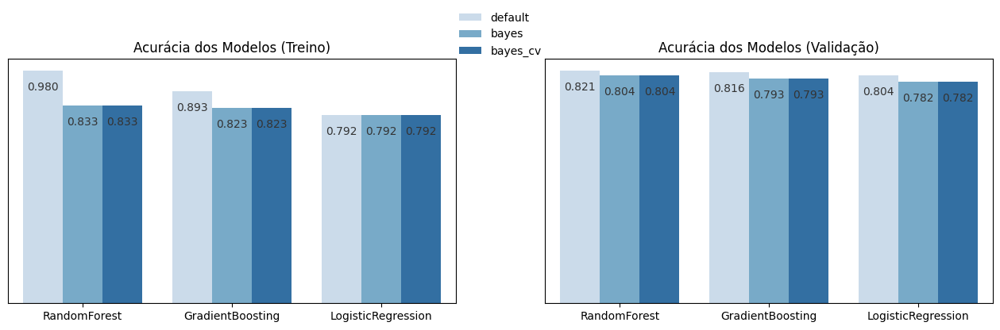

In [237]:
fig, (ax_1, ax_2) = plt.subplots(1, 2, figsize=(16, 4))
ax_1 = sns.barplot(result_clfs, x="model_clf", y="acc_train", hue='train_mode', estimator="sum", order=['RandomForest', 'GradientBoosting', 'LogisticRegression'] , palette='Blues', ax=ax_1)
ax_1.bar_label(ax_1.containers[0],label_type='edge', padding=-20,color='#333', fontsize=10, fmt='%.3f')
ax_1.bar_label(ax_1.containers[1],label_type='edge', padding=-20,color='#333', fontsize=10, fmt='%.3f')
ax_1.bar_label(ax_1.containers[2],label_type='edge', padding=-20,color='#333', fontsize=10, fmt='%.3f')
ax_1.set_title('Acurácia dos Modelos (Treino)')
ax_1.set_ylabel('')
ax_1.set_yticks([])
sns.move_legend(
  ax_1, 
  "center",
  bbox_to_anchor=(1.1, 1.1),
  title='',
  frameon=False
)

ax_1.set_xlabel('')
ax_2 = sns.barplot(result_clfs, x="model_clf", y="acc_valid", hue='train_mode',estimator="sum", order=['RandomForest', 'GradientBoosting', 'LogisticRegression'] , palette='Blues', ax=ax_2)
ax_2.bar_label(ax_2.containers[0],label_type='edge', padding=-20,color='#333', fontsize=10, fmt='%.3f')
ax_2.bar_label(ax_2.containers[1],label_type='edge', padding=-20,color='#333', fontsize=10, fmt='%.3f')
ax_2.bar_label(ax_2.containers[2],label_type='edge', padding=-20,color='#333', fontsize=10, fmt='%.3f')
ax_2.set_title('Acurácia dos Modelos (Validação)')
ax_2.set_ylabel('')
ax_2.set_xlabel('')
ax_2.set_yticks([])
ax_2.legend().set_visible(False)

plt.show()

Com a validação cruzada podemos observar que todos os modelos (exceto o Random Forest) tiveram uma melhoria na acurácia.

O Random Forest, por outro lado, apresentou uma leve perda de acurácia em validação. Neste desafio do Kaggle, a acurácia é utilizada como parâmetro de eficácia do modelo, e devido à sua importância nesse contexto específico, optaremos por não considerar outras validações do modelo.

De qualquer forma, vamos gerar as "submissions" do Kaggle de acordo com a melhor acurácia para cada modelo, afim de verificarmos o desempenho deles e após isso, retomaremos a análise para conclusão do estudo.

Ficou assim as "submissions":

- Random Forest => Default
- Gradient Boosting => Bayes + CV
- Logistic Regression => Default

## <a id='toc1_4_'></a>[Submeter soluções no Kaggle (submissions)](#toc0_)

In [238]:
def submission_kaggle(series_pred, train_mode_name):
  sub_kaggle = pd.Series(series_pred, index=df_test['PassengerId'], name='Survived')
  sub_kaggle.to_csv(f'./submissions/submission_{train_mode_name}.csv', header=True)

In [239]:
df_test.head()

,PassengerId,Pclass,Sex,Age,SibSp,Parch,Fare,Embarked
0,892,3,1,34.5,0,0,7.8292,1
1,893,3,0,47.0,1,0,7.0000,2
2,894,2,1,62.0,0,0,9.6875,1
3,895,3,1,27.0,0,0,8.6625,2
4,896,3,0,22.0,1,1,12.2875,2


### <a id='toc1_4_1_'></a>[Random Forest (Default)](#toc0_)

In [240]:
y_pred_test_clf_rfc = clf_rfc.predict(df_test[X_columns])
submission_kaggle(y_pred_test_clf_rfc, 'rfc_default')

![result](./images/rfc_default.png)

### <a id='toc1_4_2_'></a>[Gradient Boosting (Bayes + CV)](#toc0_)

In [241]:
y_pred_test_clf_gbc_bayes_cv = clf_gbc_bayes_cv.predict(df_test[X_columns])
submission_kaggle(y_pred_test_clf_gbc_bayes_cv, 'gbc_bayes_cv')

![result](./images/gbc_bayes_cv.png)

### <a id='toc1_4_3_'></a>[Logistic Regression (Default)](#toc0_)

In [242]:
y_pred_test_clf_lr = clf_lr.predict(df_test[X_columns])
submission_kaggle(y_pred_test_clf_lr, 'lr_default')

![result](./images/lr_default.png)

Podemos verificar que os resultados com a base de test do Kaggle apresentou um valor de accurácia um pouco mais baixo do que verificamos em validação, mas o modelo se comportou da mesma forma, onde o Gradient Boosting teve o melhor resultado, seguido pelo Random Forest e Logistic Regression.

Agora vou desconsiderar os modelos "menos" eficazes e vamos verificar o que podemos fazer para melhorar esse modelo Gradient Boosting.

**Como este trabalho e em caráter de estudo, adotamos esta postura, mas os modelos poderiam ser novamente testados com novos hiperparâmetros, poderíamos normalizar os dados, e até mesmo testar novos modelos de classificação, como por exemplo KNN.**

## <a id='toc1_5_'></a>[Melhorando o modelo com "mais" hiperparâmetros](#toc0_)

Em meus estudos encontrei a publicação abaixo do mestre Mario Filho e resolvi testar.

<img src="./images/mario_filho.png" alt="Mario Filho" style="height: 500px;">

Acho muito difícil, mas para quem ainda não conhece o Mário Filho, ele é simplesmente Kaggle Competitions Grandmaster, autor de livro e referência em Data Sciense no mundo.

Vale muito a pena conferir e acompanhá-lo através de suas [redes sociais](https://www.linkedin.com/company/mariofilho/) e [site](https://mariofilho.com/).

Mas antes de já colocar na prática, vamos verificar quais foram os hiperparâmetros que passamos para treinar o modelo anteriormente:

Hiperparâmetros:
```
'loss': ['log_loss', 'exponential'],
'criterion': ['friedman_mse', 'squared_error'],
'n_estimators': (10, 200),
'learning_rate': (0.01, 1.0),
'max_depth': (1, 20),
'min_samples_split': (2, 10),
'min_samples_leaf': (1, 10),
'subsample': (0.1, 1.0),
```

### <a id='toc1_5_1_'></a>[Retreinando com novos hiperparâmetros](#toc0_)

In [243]:
clf_gbc_params_1 = {
    'loss': ['log_loss', 'exponential'],
    'criterion': ['friedman_mse', 'squared_error'],
    'n_estimators': (10, 300),
    'learning_rate': (0.01, 0.1),
    'max_depth': (1, 20),
    'min_samples_split': (2, 10),
    'min_samples_leaf': (1, 10),
    'subsample': (0.1, 1.0),
}

clf_gbc_bayes_cv_1 = BayesSearchCV(
                          clf_gbc,                  # Modelo a ser otimizado
                          clf_gbc_params_1,         # Espaço de busca para os hiperparâmetros
                          n_iter=64,                # Número de iterações da busca bayesiana
                          scoring='accuracy',       # Métrica de avaliação
                          n_jobs=-1,                # Número de trabalhos paralelos, -1 utiliza todos os núcleos disponíveis
                          cv=10,                    # Número de dobras (folds) para validação cruzada
                          random_state=0
                      )

clf_gbc_bayes_cv_1.fit(X_train, y_train)

BayesSearchCV(cv=10, estimator=GradientBoostingClassifier(random_state=0),
              n_iter=64, n_jobs=-1, random_state=0, scoring='accuracy',
              search_spaces={'criterion': ['friedman_mse', 'squared_error'],
                             'learning_rate': (0.01, 0.1),
                             'loss': ['log_loss', 'exponential'],
                             'max_depth': (1, 20), 'min_samples_leaf': (1, 10),
                             'min_samples_split': (2, 10),
                             'n_estimators': (10, 300),
                             'subsample': (0.1, 1.0)})

In [244]:
clf_gbc_bayes_cv_1.best_params_

OrderedDict([('criterion', 'squared_error'),
             ('learning_rate', 0.015053668048782696),
             ('loss', 'exponential'),
             ('max_depth', 3),
             ('min_samples_leaf', 1),
             ('min_samples_split', 4),
             ('n_estimators', 276),
             ('subsample', 0.5645485872486374)])

In [245]:
acc_clf_gbc_bayes_train_1 = clf_gbc_bayes_cv_1.best_score_
acc_clf_gbc_bayes_test_1 = clf_gbc_bayes_cv_1.score(X_valid, y_valid)
print(f'Valores de acurácia são: Train = {acc_clf_gbc_bayes_train_1:.5f} | Valid = {acc_clf_gbc_bayes_test_1:.5f}')

result_clfs.loc[len(result_clfs)] = {
  'model_clf':'GradientBoosting',
  'train_mode':'bayes_cv_1',
  'acc_train':acc_clf_gbc_bayes_train_1, 
  'acc_valid':acc_clf_gbc_bayes_test_1
}

Valores de acurácia são: Train = 0.83848 | Valid = 0.80447


### <a id='toc1_5_2_'></a>[Comparando os modelos](#toc0_)

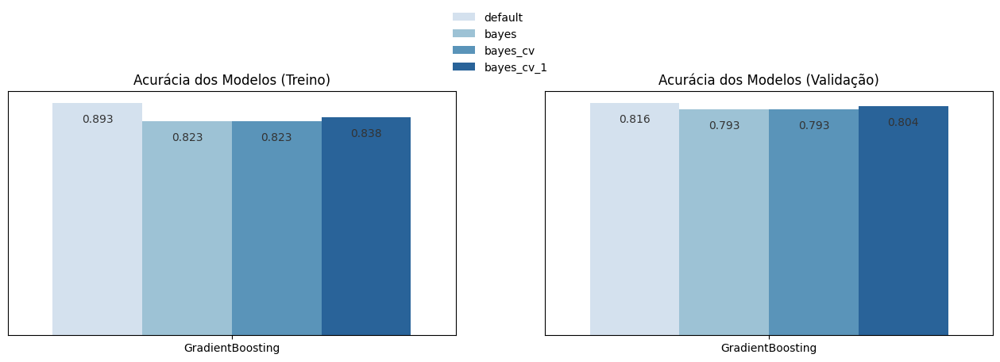

In [246]:
fig, (ax_1, ax_2) = plt.subplots(1, 2, figsize=(16, 4))
ax_1 = sns.barplot(result_clfs.query('model_clf == "GradientBoosting"'), x="model_clf", y="acc_train", hue='train_mode', estimator="sum", order=['GradientBoosting'] , palette='Blues', ax=ax_1)
ax_1.bar_label(ax_1.containers[0],label_type='edge', padding=-20,color='#333', fontsize=10, fmt='%.3f')
ax_1.bar_label(ax_1.containers[1],label_type='edge', padding=-20,color='#333', fontsize=10, fmt='%.3f')
ax_1.bar_label(ax_1.containers[2],label_type='edge', padding=-20,color='#333', fontsize=10, fmt='%.3f')
ax_1.bar_label(ax_1.containers[3],label_type='edge', padding=-20,color='#333', fontsize=10, fmt='%.3f')
ax_1.set_title('Acurácia dos Modelos (Treino)')
ax_1.set_ylabel('')
ax_1.set_yticks([])
sns.move_legend(
  ax_1, 
  "center",
  bbox_to_anchor=(1.1, 1.2),
  title='',
  frameon=False
)

ax_1.set_xlabel('')
ax_2 = sns.barplot(result_clfs.query('model_clf == "GradientBoosting"'), x="model_clf", y="acc_valid", hue='train_mode',estimator="sum", order=['GradientBoosting'] , palette='Blues', ax=ax_2)
ax_2.bar_label(ax_2.containers[0],label_type='edge', padding=-20,color='#333', fontsize=10, fmt='%.3f')
ax_2.bar_label(ax_2.containers[1],label_type='edge', padding=-20,color='#333', fontsize=10, fmt='%.3f')
ax_2.bar_label(ax_2.containers[2],label_type='edge', padding=-20,color='#333', fontsize=10, fmt='%.3f')
ax_2.bar_label(ax_2.containers[3],label_type='edge', padding=-20,color='#333', fontsize=10, fmt='%.3f')
ax_2.set_title('Acurácia dos Modelos (Validação)')
ax_2.set_ylabel('')
ax_2.set_xlabel('')
ax_2.set_yticks([])
ax_2.legend().set_visible(False)

plt.show()

Podemos verificar que houve uma melhora, mas será que tivemos alguma melhora em teste?

Vamos submeter esse novo modelo e vamos ver como ele se comporta.

### <a id='toc1_5_3_'></a>[Submeter no kaggle](#toc0_)

In [247]:
y_pred_test_clf_gbc_bayes_cv_1 = clf_gbc_bayes_cv_1.predict(df_test[X_columns])
submission_kaggle(y_pred_test_clf_gbc_bayes_cv_1, 'gbc_bayes_cv_1')

![result](./images/gbc_bayes_cv_1.png)

Mesmo com a mesma acurácia em validação o modelo se comportou melhor em test e seguimos o melhor modelo até aqui em "produção".

Mas será que podemos ainda melhorar?

Sempre dá para melhorar...kkkkkkkk

## <a id='toc1_6_'></a>[Será que existe uma nova variável "escondida"?](#toc0_)

E aquela frase clássica...

***"Primeiro mulheres e crianças"***

Será que faz sentido?

Será que realmente aconteceu? Será que podemos usar?

Vamos avaliar

### <a id='toc1_6_1_'></a>[Analisando mulheres e homens salvos](#toc0_)

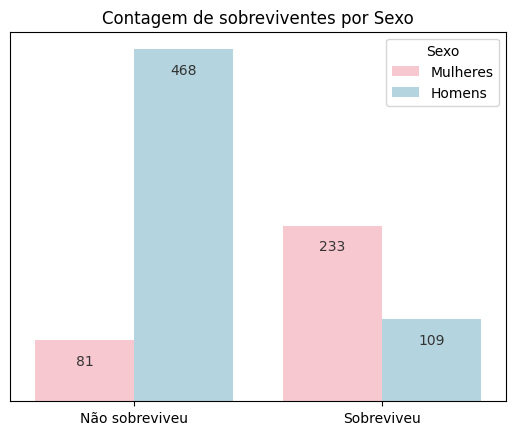

In [248]:
palette = {0: 'pink', 1: 'lightblue'}
ax = sns.countplot(data=df_train, x='Survived', hue='Sex', palette=palette)
plt.title('Contagem de sobreviventes por Sexo')
plt.xticks([0,1],['Não sobreviveu', 'Sobreviveu'])
plt.xlabel('')
plt.ylabel('')
plt.yticks([])
plt.legend(title='Sexo', labels=['Mulheres', 'Homens'])
ax.bar_label(ax.containers[0],label_type='edge', padding=-20,color='#333', fontsize=10)
ax.bar_label(ax.containers[1],label_type='edge', padding=-20,color='#333', fontsize=10)

plt.show()

Podemos verificar que sobreviveram muito mais mulheres do que homens. Mas qual o percentual de sobreviventes em relação ao seu próprio sexo?

| Sexo     | % Sobreviventes | % Não sobreviventes |
| -------- | --------------- | ------------------- |
| Mulheres | 74.2%           | 25.8%               |
| Homens   | 18.9%           | 81.1%               |

<br>
<details>
<summary>Para quem quiser o código:</summary>

```
  grouped_size = df_train.groupby(['Sex', 'Survived']).size().reset_index(name='Count')

  total_by_sex = df_train.groupby('Sex').size().reset_index(name='Total')

  grouped_size['Proportion'] = grouped_size['Count'] / total_by_sex.merge(grouped_size, on='Sex')['Total']
  grouped_size['Proportion'] = (grouped_size['Proportion'] * 100).round(1)

  print(grouped_size)
```

</details>




Analisando os dados acima vimos que parcialmente a resposta de "primeiro mulheres e crianças" é correta.

Agora vamos analisar as crianças.

### <a id='toc1_6_2_'></a>[Analisando as crianças salvas](#toc0_)

Para isso vamos verificar o total de crianças e verificar o percentual de sobreviventes:

|   Survived |   count |
|-----------:|--------:|
|          1 |      40 |
|          0 |      29 |

<br>
<details>
<summary>Para quem quiser o código:</summary>

```
  df_train.query('Age <= 12')['Survived'].value_counts()
```
</details>

Na tabela acima podemos verificar que o percentual de crianças sobreviventes foi de 57.9%.

Não é um valor muito significativo, mas vamos avançar no nosso estudo.


Agora como estão distribuidos os sexos entre as crianças sobreviventes.

|   Sex |   Survived |   Total |
|------:|-----------:|--------:|
|     0 |          0 |      13 |
|     0 |          1 |      19 |
|     1 |          0 |      16 |
|     1 |          1 |      21 |

<br>
<details>
<summary>Para quem quiser o código:</summary>

```
  df_train.query('Age <= 12').groupby(['Sex', 'Survived']).size().reset_index(name='Total')
```
</details>

Podemos observar que os dados são bem mais homogêneos, não há uma diferença considerável entre sexo e crianças sobreviventes.

Agora o que podemos analisar é se tirarmos as crianças e separarmos nossos dados entre homens, mulheres e crianças. Será que podemos ter algum _insight_?

Vamos ver!!!

## <a id='toc1_7_'></a>[Adicionando uma feature nova](#toc0_)

Vamos criar uma coluna chamada "AgeCategory" e vamos separar da seguinte forma:

- Crianças (age <= 12) = 2
- Mulheres = 0
- Homens = 1

In [249]:
def fn_age_category(age, sex):
  if age <= 12:
    return 2
  else:
    return sex

df_train['Sex'].value_counts()

df_train['AgeCategory'] = df_train.apply(lambda row: fn_age_category(row['Age'], row['Sex']), axis=1).astype(int)

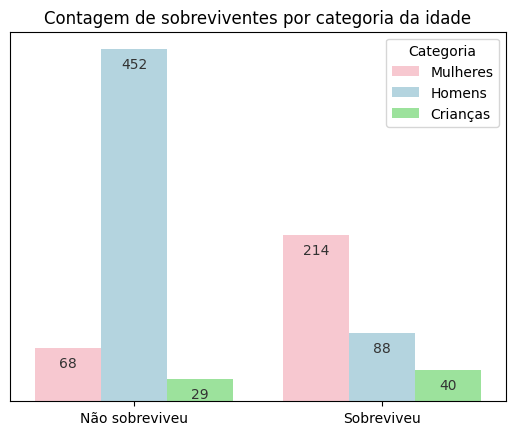

In [250]:
palette = {0: 'pink', 1: 'lightblue', 2: 'lightgreen'}
ax = sns.countplot(data=df_train, x='Survived', hue='AgeCategory', palette=palette)
plt.title('Contagem de sobreviventes por categoria da idade')
plt.xticks([0,1],['Não sobreviveu', 'Sobreviveu'])
plt.xlabel('')
plt.ylabel('')
plt.yticks([])
plt.legend(title='Categoria', labels=['Mulheres', 'Homens', 'Crianças'])
ax.bar_label(ax.containers[0],label_type='edge', padding=-16,color='#333', fontsize=10)
ax.bar_label(ax.containers[1],label_type='edge', padding=-16,color='#333', fontsize=10)
ax.bar_label(ax.containers[2],label_type='edge', padding=-16,color='#333', fontsize=10)

plt.show()

Agora vamos comparar como era a proporção de sobreviventes em relação ao sexo e agora com a categoria de idade:

**Com categoria de idade**

| Sexo     | % Sobreviventes | % Não sobreviventes |
| -------- | --------------- | ------------------- |
| Mulheres | 75.9%           | 24.1%               |
| Homens   | 16.3%           | 83.7%               |
| Crianças | 58%             | 42%                 |

**Tabela anterior com sexo**

| Sexo     | % Sobreviventes | % Não sobreviventes |
| -------- | --------------- | ------------------- |
| Mulheres | 74.2%           | 25.8%               |
| Homens   | 18.9%           | 81.1%               |

Podemos observar que houve um aumento de mulheres sobreviventes e uma queda de homens sobreviventes.

Mas será que isso faz sentido?

Vamos treinar o modelo mais eficaz até agora com essa nova abordagem, neste primeiro treino vamos desconsiderar as colunas Age e Sex, e vamos avançar com a AgeCategory.

## <a id='toc1_8_'></a>[Treinando o modelo com a nova feature](#toc0_)

In [251]:
X_columns = [
              'Pclass',
              # 'Sex',
              # 'Age',
              'AgeCategory',
              'SibSp',
              'Parch',
              'Fare',
              'Embarked'
            ]

y_columns = ['Survived']

In [252]:
X_train, X_valid, y_train, y_valid = train_test_split(df_train[X_columns], df_train[y_columns], test_size=0.20, random_state=42)

In [253]:
clf_gbc_ac = GradientBoostingClassifier(random_state=0)
clf_gbc_ac.fit(X_train, y_train)

GradientBoostingClassifier(random_state=0)

In [254]:
clf_gbc_bayes_cv_2 = BayesSearchCV(
                          clf_gbc_ac,               # Modelo a ser otimizado
                          clf_gbc_params_1,         # Espaço de busca para os hiperparâmetros
                          n_iter=64,                # Número de iterações da busca bayesiana
                          scoring='accuracy',       # Métrica de avaliação
                          n_jobs=-1,                # Número de trabalhos paralelos, -1 utiliza todos os núcleos disponíveis
                          cv=10,                    # Número de dobras (folds) para validação cruzada
                          random_state=0
                      )

clf_gbc_bayes_cv_2.fit(X_train, y_train)

BayesSearchCV(cv=10, estimator=GradientBoostingClassifier(random_state=0),
              n_iter=64, n_jobs=-1, random_state=0, scoring='accuracy',
              search_spaces={'criterion': ['friedman_mse', 'squared_error'],
                             'learning_rate': (0.01, 0.1),
                             'loss': ['log_loss', 'exponential'],
                             'max_depth': (1, 20), 'min_samples_leaf': (1, 10),
                             'min_samples_split': (2, 10),
                             'n_estimators': (10, 300),
                             'subsample': (0.1, 1.0)})

In [255]:
acc_clf_gbc_bayes_train_2 = clf_gbc_bayes_cv_2.best_score_
acc_clf_gbc_bayes_test_2 = clf_gbc_bayes_cv_2.score(X_valid, y_valid)
print(f'Valores de acurácia são: Train = {acc_clf_gbc_bayes_train_2:.5f} | Valid = {acc_clf_gbc_bayes_test_2:.5f}')

result_clfs.loc[len(result_clfs)] = {
  'model_clf':'GradientBoosting',
  'train_mode':'bayes_cv_2',
  'acc_train':acc_clf_gbc_bayes_train_2, 
  'acc_valid':acc_clf_gbc_bayes_test_2
}

Valores de acurácia são: Train = 0.84409 | Valid = 0.80447


Vamos analisar os resultados

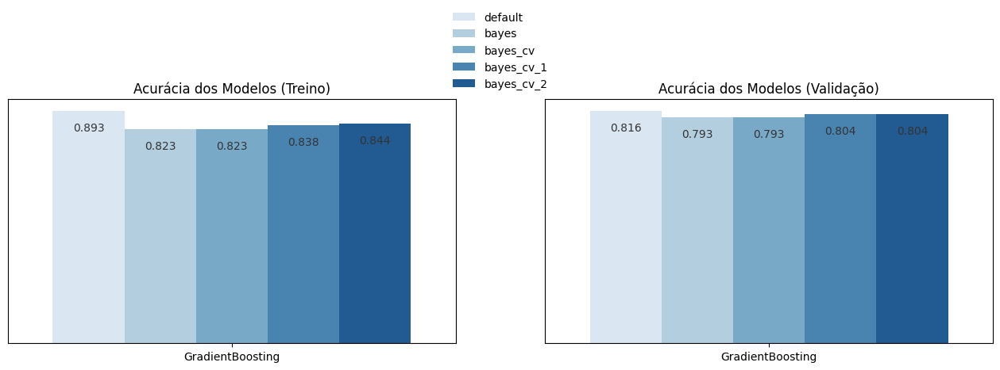

In [256]:
fig, (ax_1, ax_2) = plt.subplots(1, 2, figsize=(16, 4))
ax_1 = sns.barplot(result_clfs.query('model_clf == "GradientBoosting"'), x="model_clf", y="acc_train", hue='train_mode', estimator="sum", order=['GradientBoosting'] , palette='Blues', ax=ax_1)
ax_1.bar_label(ax_1.containers[0],label_type='edge', padding=-20,color='#333', fontsize=10, fmt='%.3f')
ax_1.bar_label(ax_1.containers[1],label_type='edge', padding=-20,color='#333', fontsize=10, fmt='%.3f')
ax_1.bar_label(ax_1.containers[2],label_type='edge', padding=-20,color='#333', fontsize=10, fmt='%.3f')
ax_1.bar_label(ax_1.containers[3],label_type='edge', padding=-20,color='#333', fontsize=10, fmt='%.3f')
ax_1.bar_label(ax_1.containers[4],label_type='edge', padding=-20,color='#333', fontsize=10, fmt='%.3f')
ax_1.set_title('Acurácia dos Modelos (Treino)')
ax_1.set_ylabel('')
ax_1.set_yticks([])
sns.move_legend(
  ax_1, 
  "center",
  bbox_to_anchor=(1.1, 1.2),
  title='',
  frameon=False
)

ax_1.set_xlabel('')
ax_2 = sns.barplot(result_clfs.query('model_clf == "GradientBoosting"'), x="model_clf", y="acc_valid", hue='train_mode',estimator="sum", order=['GradientBoosting'] , palette='Blues', ax=ax_2)
ax_2.bar_label(ax_2.containers[0],label_type='edge', padding=-20,color='#333', fontsize=10, fmt='%.3f')
ax_2.bar_label(ax_2.containers[1],label_type='edge', padding=-20,color='#333', fontsize=10, fmt='%.3f')
ax_2.bar_label(ax_2.containers[2],label_type='edge', padding=-20,color='#333', fontsize=10, fmt='%.3f')
ax_2.bar_label(ax_2.containers[3],label_type='edge', padding=-20,color='#333', fontsize=10, fmt='%.3f')
ax_2.bar_label(ax_2.containers[4],label_type='edge', padding=-20,color='#333', fontsize=10, fmt='%.3f')
ax_2.set_title('Acurácia dos Modelos (Validação)')
ax_2.set_ylabel('')
ax_2.set_xlabel('')
ax_2.set_yticks([])
ax_2.legend().set_visible(False)

plt.show()

Vamos testar com o dataframe de teste e verificar como ele se comporta no Kaggle.

Abaixo deixo um gráfico indicando a importancia dessa nova feature (AgeCategory) para o nosso modelo.

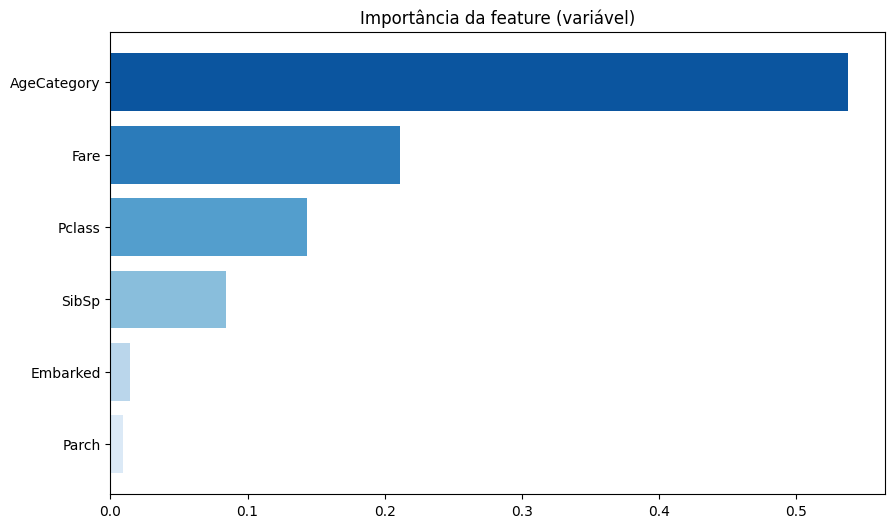

In [257]:
feature_importance = clf_gbc_ac.feature_importances_

feature_names = X_train.columns

feature_importance_df = pd.DataFrame({'Feature': feature_names, 'Importance': feature_importance})
feature_importance_df = feature_importance_df.sort_values(by='Importance', ascending=True)

plt.figure(figsize=(10, 6))
plt.barh(feature_importance_df['Feature'], feature_importance_df['Importance'], color=cmap)
plt.xlabel('')
plt.ylabel('')
plt.title('Importância da feature (variável)')
plt.show()

Vamos precisar criar o mesmo processo da coluna "AgeCategory" no dataframe de test.

In [258]:
df_test.head(3)

,PassengerId,Pclass,Sex,Age,SibSp,Parch,Fare,Embarked
0,892,3,1,34.5,0,0,7.8292,1
1,893,3,0,47.0,1,0,7.0000,2
2,894,2,1,62.0,0,0,9.6875,1


In [259]:
df_test['Sex'].value_counts()

df_test['AgeCategory'] = df_test.apply(lambda row: fn_age_category(row['Age'], row['Sex']), axis=1).astype(int)

In [260]:
df_test['AgeCategory'].value_counts()

AgeCategory
1    253
0    140
2     25
Name: count, dtype: int64

In [261]:
y_pred_test_clf_gbc_bayes_cv_2 = clf_gbc_bayes_cv_2.predict(df_test[X_columns])
submission_kaggle(y_pred_test_clf_gbc_bayes_cv_2, 'gbc_bayes_cv_2')

Resultado

<img src="./images/gbc_bayes_cv_2.png" alt="result" style="width: 90%;">
<img src="./images/best.png" alt="best_result" style="width: 90%;">



## <a id='toc1_9_'></a>[Conclusão e resumo](#toc0_)

Como meu primeiro trabalho de análise de dados encontrei algumas dificuldades de como montar este notebook de forma clara e coesa, não sei se consegui...kkkkkkkkkkkkkk

Vou fazer um resumo de como foi a linha de raciocinio para montar este trabalho:

- Limpeza dos dados inválidos e vazios dos datasets;
- Modelagem com alguns classificadores;
- Submissão no kaggle;
- "Tunado" os modelos com hiperparâmetros;
- Realizado ensaios com validação cruzada;
- Com um _insight_ foi encontrada uma nova variável;
- Retreinamos o modelo com essa variável;
- Submissão no kaggle e com a melhor acurácia.

Quais os próximos passos poderiamos adotar?

- Usar novos modelos de classificação;
- "Tunar" um pouco mais
- Unir esses modelos e usar "ensemble" para verificar seus comportamentos

Foi bem trabalhoso, mas muito gratificante o resultado.

A experiência de aprender muito mais e com uma aplicação prática de tudo que estudo/estudei foi bastante motivador.

Se quiserem me enviar sugestões, conversar ou trocar experiências, é só me procurar no [linkedin](https://www.linkedin.com/in/paulo-robinson-giaciani/).

Abraços e bora estudar mais...kkkkkkkk